In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install fastparquet

In [ ]:
pip install pyspark

In [ ]:
import pyspark
from pyspark.sql import SparkSession
spark = SparkSession.builder \
    .appName("Taxi Trip Duration Prediction") \
    .config("spark.driver.memory", "8g") \
    .config("spark.executor.memory", "8g") \
    .config("spark.executor.cores", "4") \
    .getOrCreate()

In [ ]:
lookup_df = spark.read.csv("/content/drive/Shareddrives/DATS6450-Project3/taxi_zone_lookup.csv", header=True, inferSchema=True)
lookup_df.write.parquet("taxi_zone_lookup.parquet", mode="overwrite")
from pyspark.sql.types import StructType, StructField, IntegerType, DoubleType, StringType, TimestampType

# Define explicit schema
schema = StructType([
    StructField("VendorID", IntegerType(), True),
    StructField("tpep_pickup_datetime", TimestampType(), True),
    StructField("tpep_dropoff_datetime", TimestampType(), True),
    StructField("passenger_count", IntegerType(), True),
    StructField("trip_distance", DoubleType(), True),
    StructField("RatecodeID", IntegerType(), True),
    StructField("store_and_fwd_flag", StringType(), True),
    StructField("PULocationID", IntegerType(), True),
    StructField("DOLocationID", IntegerType(), True),
    StructField("payment_type", IntegerType(), True),
    StructField("fare_amount", DoubleType(), True),
    StructField("extra", DoubleType(), True),
    StructField("mta_tax", DoubleType(), True),
    StructField("tip_amount", DoubleType(), True),
    StructField("tolls_amount", DoubleType(), True),
    StructField("improvement_surcharge", DoubleType(), True),
    StructField("total_amount", DoubleType(), True),
    StructField("congestion_surcharge", DoubleType(), True)  # Force this to DoubleType
])


df = spark.read.parquet("/content/drive/Shareddrives/DATS6450-Project3/yellow_tripdata_2011-0*")
lookup_df.show(5)


+----------+-------------+--------------------+------------+
|LocationID|      Borough|                Zone|service_zone|
+----------+-------------+--------------------+------------+
|         1|          EWR|      Newark Airport|         EWR|
|         2|       Queens|         Jamaica Bay|   Boro Zone|
|         3|        Bronx|Allerton/Pelham G...|   Boro Zone|
|         4|    Manhattan|       Alphabet City| Yellow Zone|
|         5|Staten Island|       Arden Heights|   Boro Zone|
+----------+-------------+--------------------+------------+
only showing top 5 rows



# Question 1
Identify regions in the city with high demand for taxis. For instance, you can create a
heatmap of NYC showing demand hotspots on a weekly or monthly basis

1. First we would merge df(main dataframe) with our lookupzone_df which consists of zones and borough of the particualr locationid which could be mappeed with pickup and drop location ID.
2. later we use taxi_zones.shp file to mape these locations to the map and visualise using matplotlib

In [ ]:
pip install geopandas matplotlib


+----------------+----------------+
|Null_PU_Location|Null_DO_Location|
+----------------+----------------+
|        89105859|        89105859|
+----------------+----------------+

Before Join: 89105859
After PU Join: 89105859


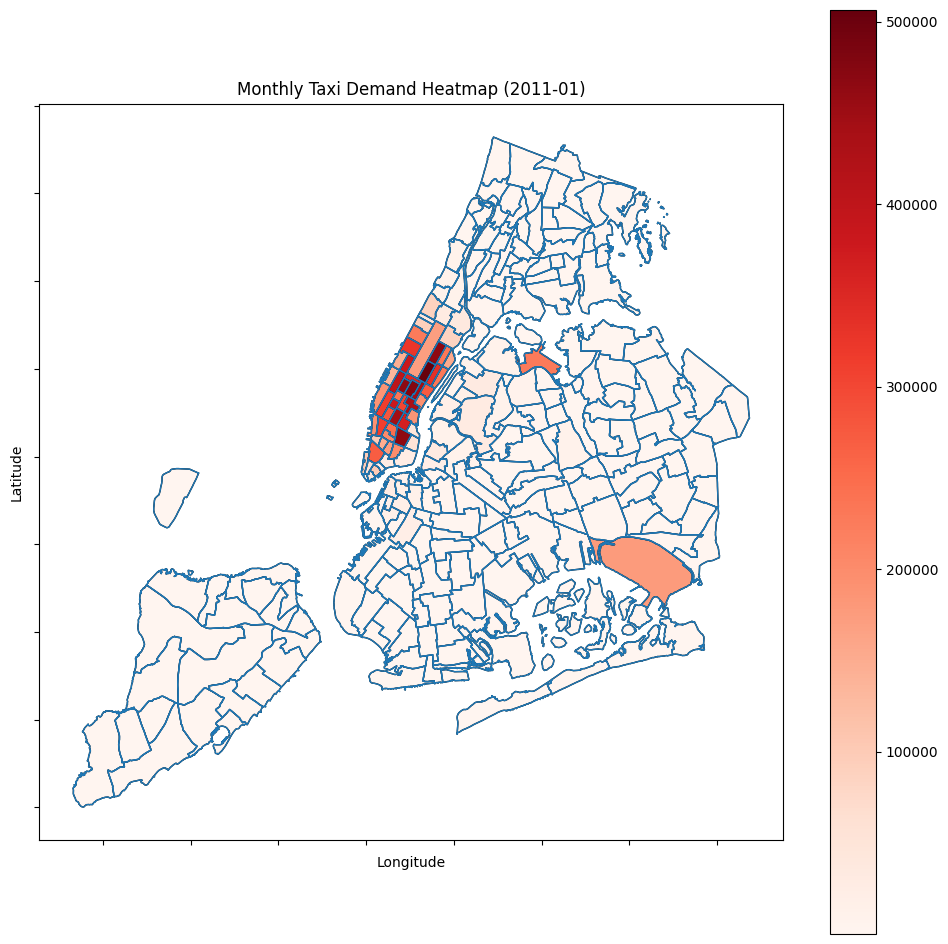

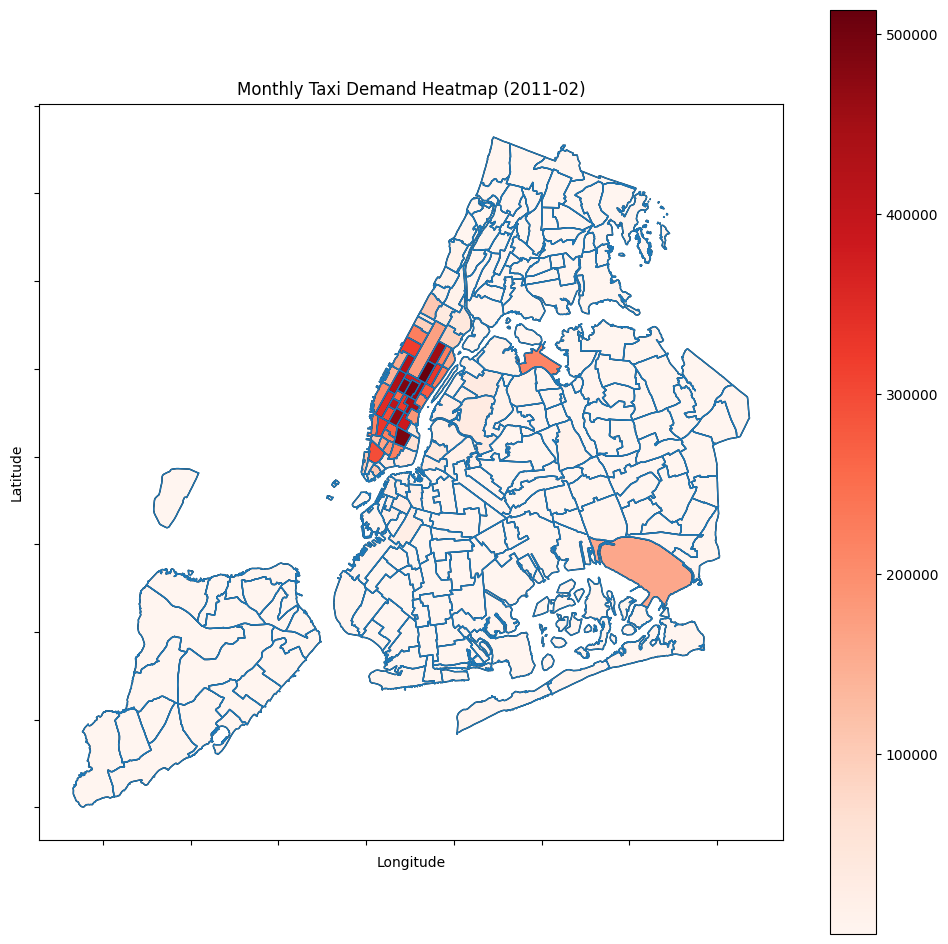

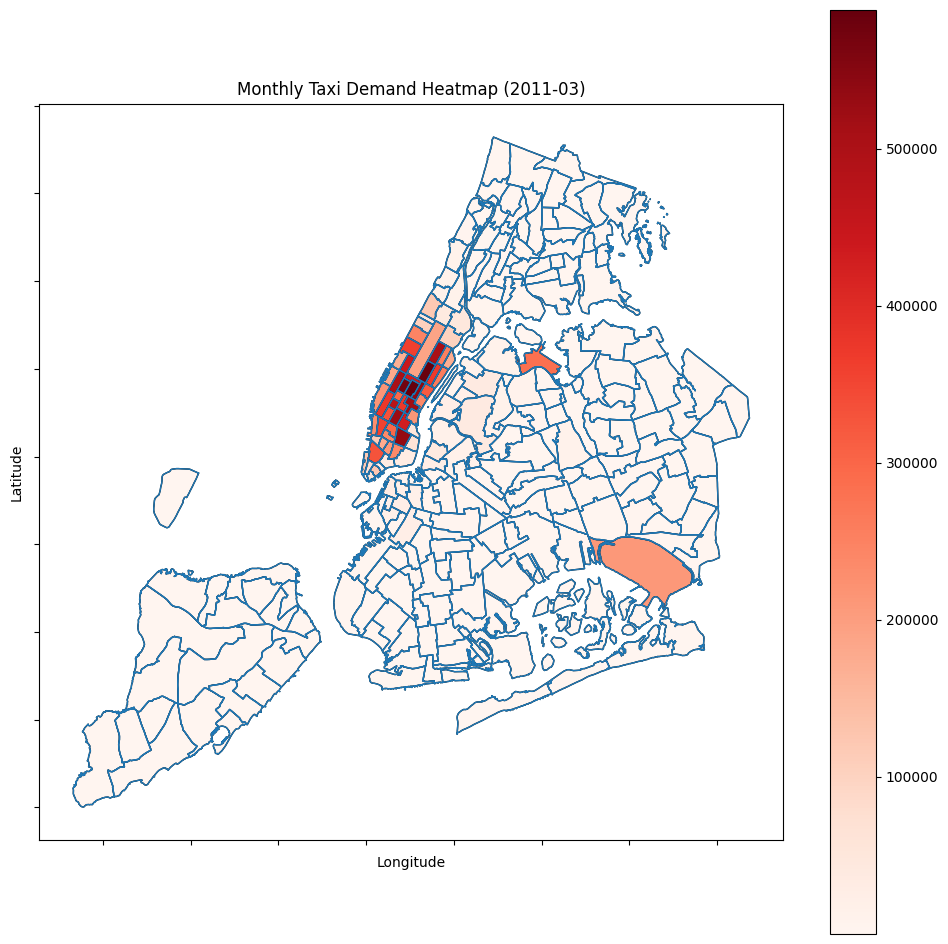

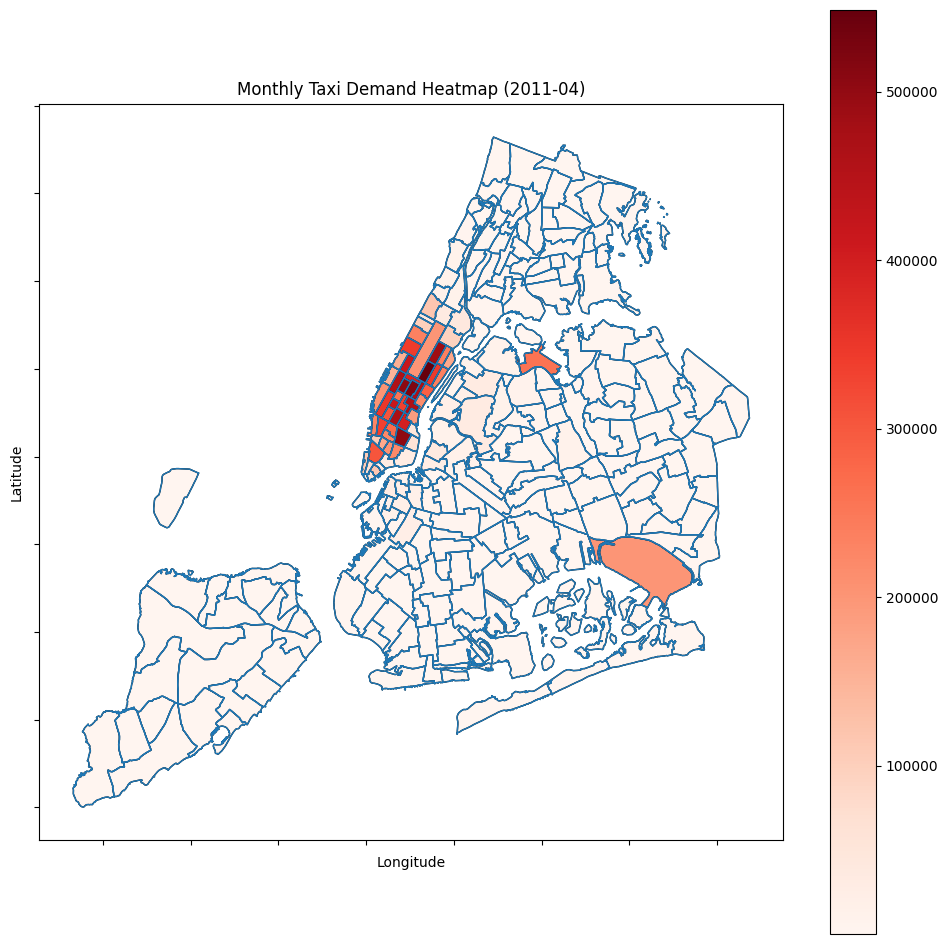

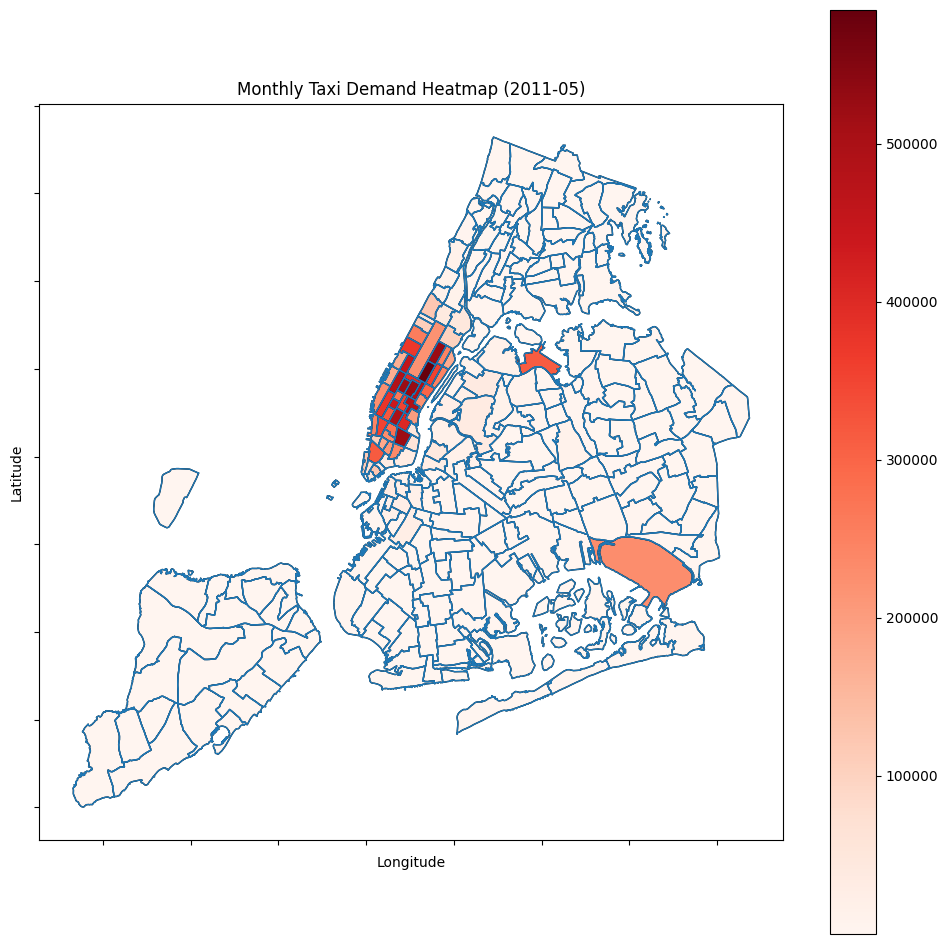

...

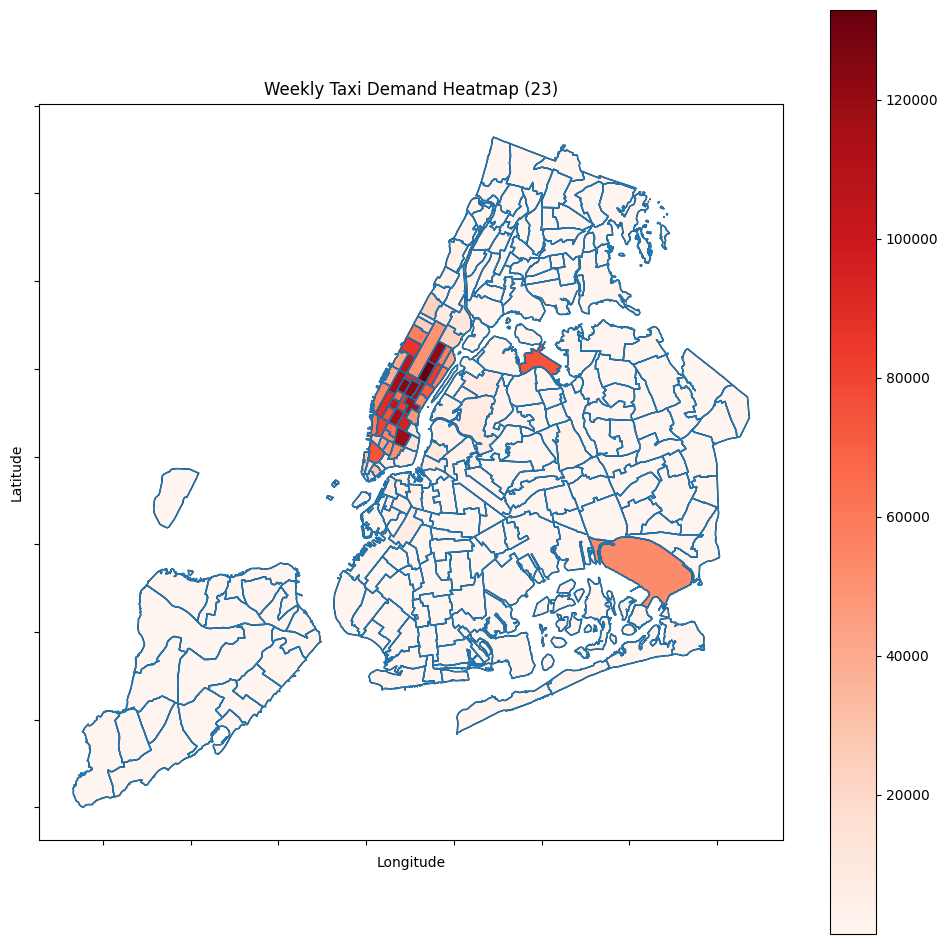

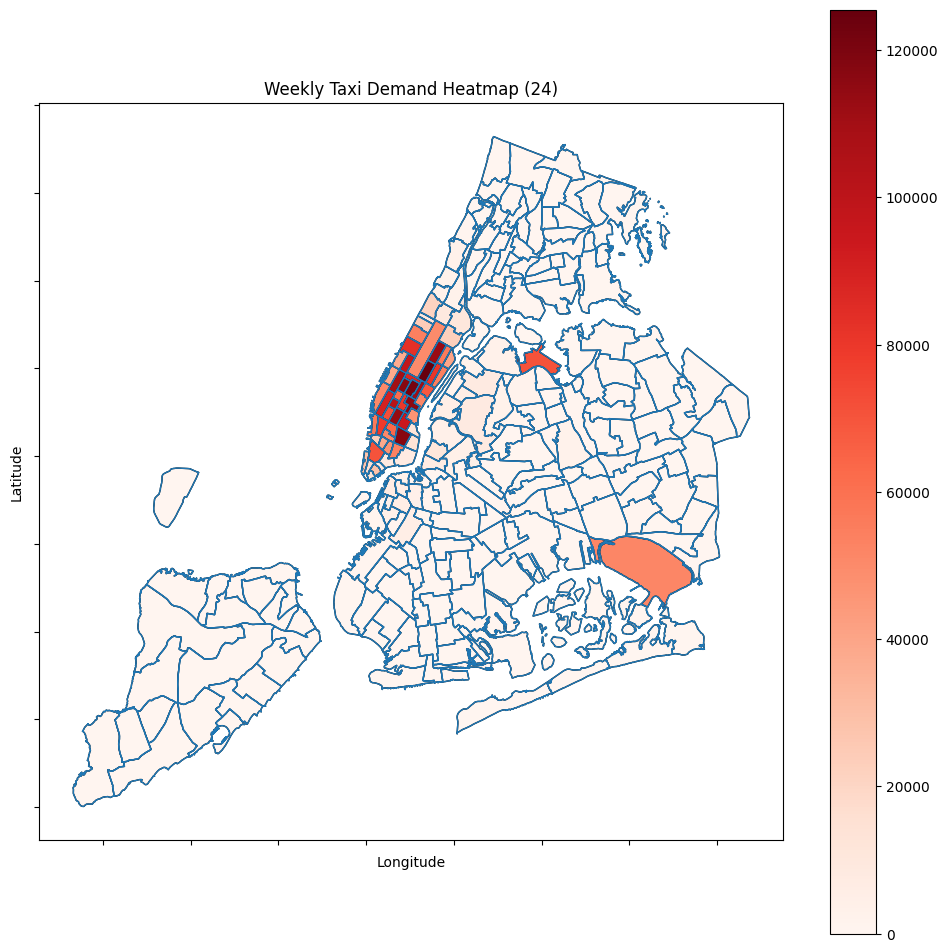

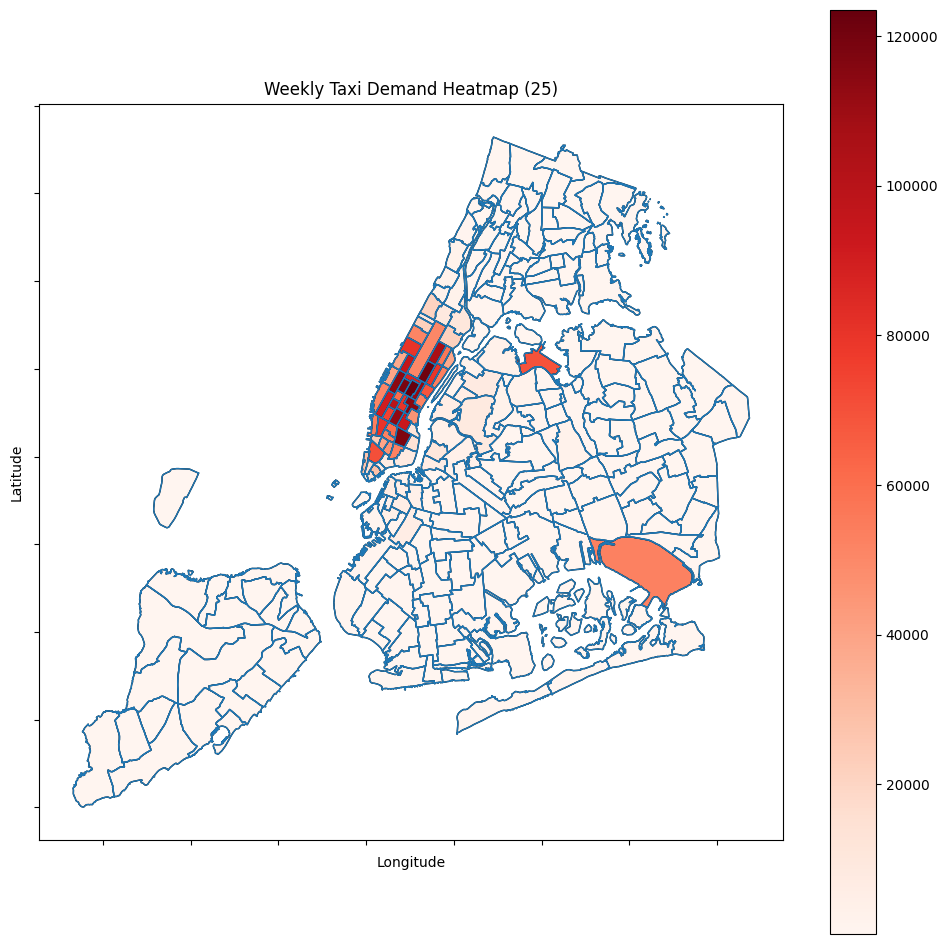

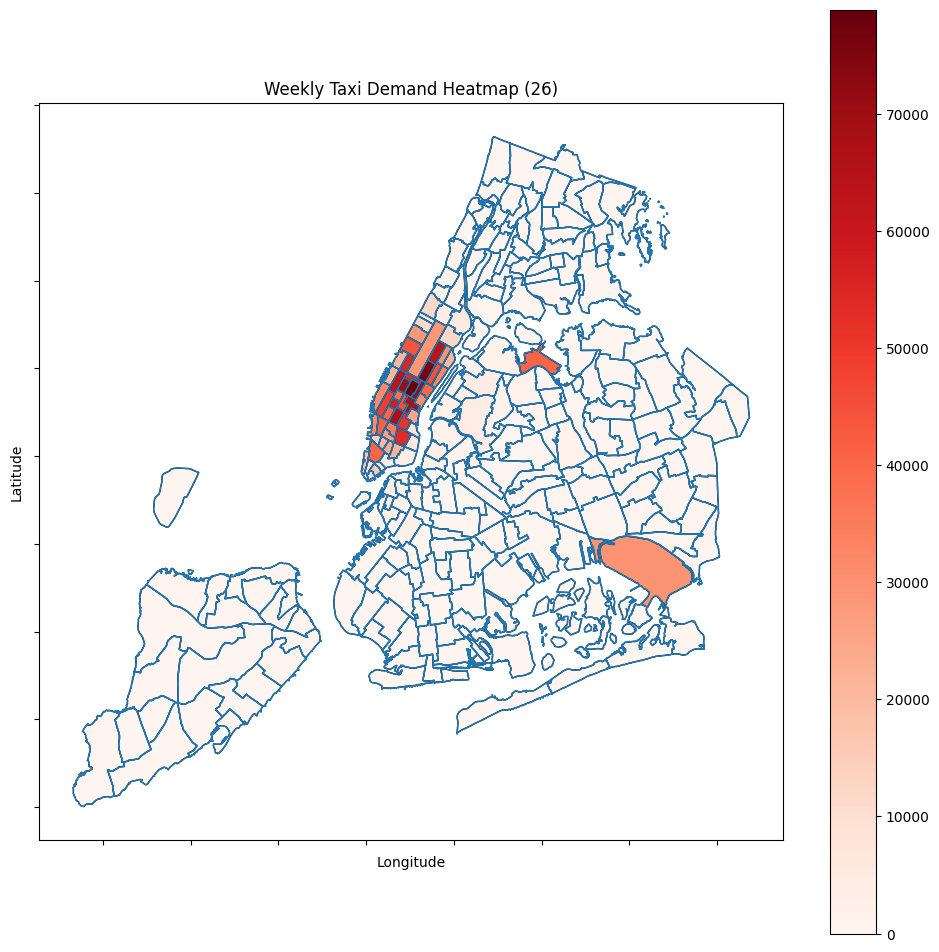

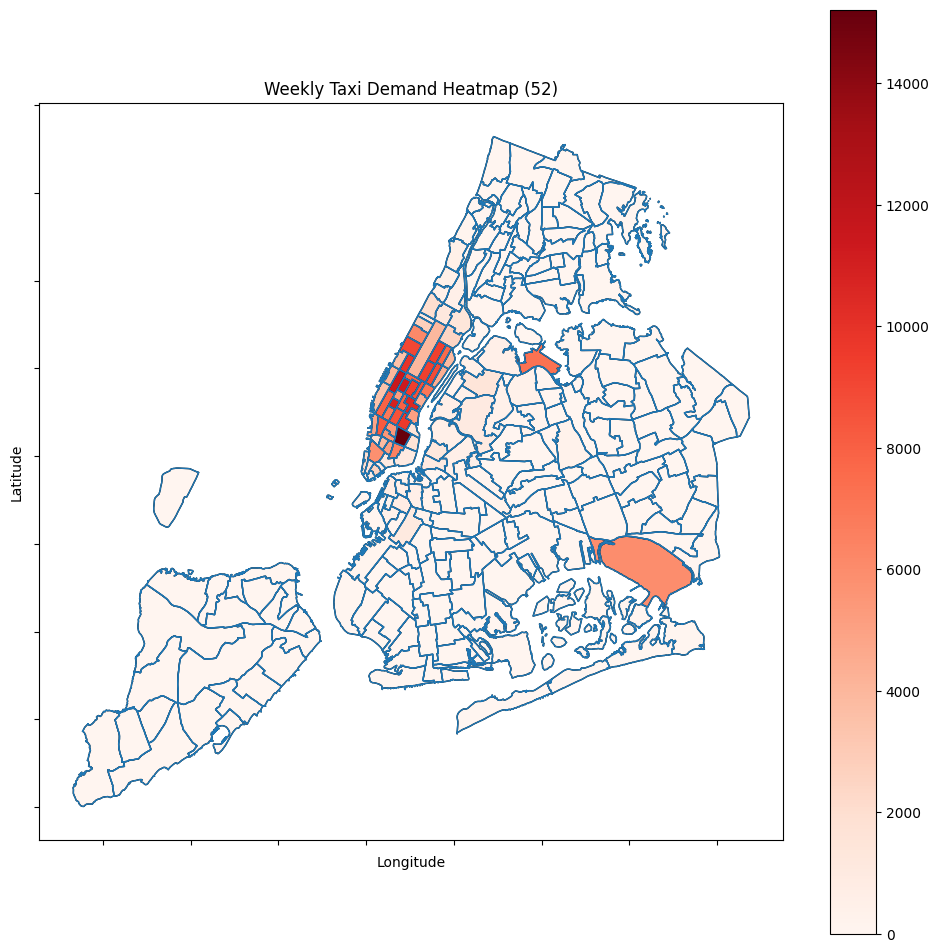

In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, count, date_format, weekofyear
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import pandas as pd

# Initialize Spark session
spark = SparkSession.builder.appName("NYC_Taxi_Demand").getOrCreate()

# Debug: Check for missing LocationIDs before joining
df.select(
    count(col("PULocationID").isNull()).alias("Null_PU_Location"),
    count(col("DOLocationID").isNull()).alias("Null_DO_Location")
).show()

# Perform joins without modifying original df
df_joined = df.join(
    lookup_df.withColumnRenamed("LocationID", "PULocationID"),
    on="PULocationID",
    how="left"
).withColumnRenamed("Borough", "Pickup_Borough") \
 .withColumnRenamed("Zone", "Pickup_Zone")

df_joined = df_joined.join(
    lookup_df.withColumnRenamed("LocationID", "DOLocationID"),
    on="DOLocationID",
    how="left"
).withColumnRenamed("Borough", "Dropoff_Borough") \
 .withColumnRenamed("Zone", "Dropoff_Zone")

# Debug: Ensure joins don’t reduce row count significantly
print("Before Join:", df.count())
print("After PU Join:", df_joined.count())

# Create demand data aggregated by Month & Week
demand_monthly = df_joined.groupBy(
    date_format(col("tpep_pickup_datetime"), "yyyy-MM").alias("Month"),
    col("Pickup_Zone")
).agg(count("*").alias("Trip_Count_month"))

demand_weekly = df_joined.groupBy(
    col("Pickup_Zone"),
    weekofyear(col("tpep_pickup_datetime")).alias("Week")
).agg(count("*").alias("Trip_Count_week"))

# Convert to Pandas for plotting
demand_month_pd = demand_monthly.toPandas().pivot(index='Pickup_Zone', columns='Month', values='Trip_Count_month').fillna(0)
demand_week_pd = demand_weekly.toPandas().pivot(index='Pickup_Zone', columns='Week', values='Trip_Count_week').fillna(0)

# Load NYC neighborhoods shapefile
nyc_map = gpd.read_file("/content/drive/Shareddrives/DATS6450-Project3/taxi_zones.shp")

# Merge data with map
nyc_month_map = nyc_map.merge(demand_month_pd, how="left", left_on="zone", right_on="Pickup_Zone")
nyc_week_map = nyc_map.merge(demand_week_pd, how="left", left_on="zone", right_on="Pickup_Zone")
# Function to plot heatmaps for multiple months/weeks
def plot_heatmaps(geo_df, time_intervals, title_prefix):
    for time_period in time_intervals:
        if time_period in geo_df.columns:
            fig, ax = plt.subplots(1, 1, figsize=(12, 12))
            geo_df.boundary.plot(ax=ax, linewidth=1)  # Plot boundaries
            heatmap = geo_df.plot(column=time_period, ax=ax, legend=True, cmap='Reds',
                                  missing_kwds={"color": "lightgrey", "label": "No data"},
                                  edgecolor='black')  # Plot heatmap
            plt.title(f'{title_prefix} Taxi Demand Heatmap ({time_period})')
            plt.xlabel('Longitude')
            plt.ylabel('Latitude')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            plt.show()

# Plot heatmaps for all months
plot_heatmaps(nyc_month_map, demand_month_pd.columns, "Monthly")

# Plot heatmaps for all weeks
plot_heatmaps(nyc_week_map, demand_week_pd.columns, "Weekly")


As seen from above we could observe the regions in new york map with different ranges of demand in different weeks and months. As observed we could see that there are certain ares in newyork which always remain in high demand or low demand

#Question 2

Predict the duration of a taxi trip based on trip start time and location (pick up and drop
off)

Steps:
1. We would remove the null vales and columns which would not be essential or completely null
2. We use linear regression to predict the duration of the trip which is a calculated column which is obtained from the difference of pickup and drop hour.
3. Later we use MLFlow to incorporate pipelines for an end to end Ml workflow.

In [ ]:
from pyspark.sql.functions import col, sum, when
df = df.drop("congestion_surcharge", "airport_fee")
df.select([sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in df.columns]).show()
df.count()

+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+
|VendorID|tpep_pickup_datetime|tpep_dropoff_datetime|passenger_count|trip_distance|RatecodeID|store_and_fwd_flag|PULocationID|DOLocationID|payment_type|fare_amount|extra|mta_tax|tip_amount|tolls_amount|improvement_surcharge|total_amount|
+--------+--------------------+---------------------+---------------+-------------+----------+------------------+------------+------------+------------+-----------+-----+-------+----------+------------+---------------------+------------+
|       0|                   0|                    0|              0|            0|         0|          43632433|           0|           0|           0|          0|    0|      0|         0|           0|                    0|           0|
+--------+--------------------+-----------------

89105859

In [ ]:
pip install mlflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.2/28.2 MB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 53.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.0/684.0 kB 31.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.4/203.4 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.3 MB/s eta 0:00:00


In [ ]:
from pyspark.sql.functions import unix_timestamp, hour, date_format
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
import mlflow
import mlflow.spark

# Sample and prepare
sampled_df = df.sample(fraction=0.01, seed=42)

# Load zone data
zone_lookup = spark.read.csv("/content/drive/Shareddrives/DATS6450-Project3/taxi_zone_lookup.csv", header=True, inferSchema=True)

# Join on PULocationID
zone_df_pu = zone_lookup.withColumnRenamed("LocationID", "PULocationID").withColumnRenamed("Zone", "Pickup_Zone")
df1 = sampled_df.join(zone_df_pu, on="PULocationID", how="left")

# Join on DOLocationID
zone_df_do = zone_lookup.withColumnRenamed("LocationID", "DOLocationID").withColumnRenamed("Zone", "Drop_Zone")
df1 = df1.join(zone_df_do, on="DOLocationID", how="left")

# Add time-based features
df1 = df1.withColumn("Hour", hour("tpep_pickup_datetime")) \
         .withColumn("DayOfWeek", date_format("tpep_pickup_datetime", "EEEE"))

# Compute trip duration
df1 = df1.withColumn("Trip_Duration",
                     (unix_timestamp("tpep_dropoff_datetime") - unix_timestamp("tpep_pickup_datetime")) / 60)

# Drop nulls
df1 = df1.na.drop(subset=["Trip_Duration", "Pickup_Zone", "Drop_Zone", "DayOfWeek"])

# Index categorical variables
indexer_pickup_zone = StringIndexer(inputCol="Pickup_Zone", outputCol="Pickup_Zone_Index", handleInvalid="keep")
indexer_drop_zone = StringIndexer(inputCol="Drop_Zone", outputCol="Drop_Zone_Index", handleInvalid="keep")
indexer_day_of_week = StringIndexer(inputCol="DayOfWeek", outputCol="DayOfWeek_Index", handleInvalid="keep")

# One-hot encoding
encoder = OneHotEncoder(inputCols=["Pickup_Zone_Index", "Drop_Zone_Index", "DayOfWeek_Index"],
                        outputCols=["Pickup_Zone_OHE", "Drop_Zone_OHE", "DayOfWeek_OHE"])

# Assemble + scale
assembler = VectorAssembler(inputCols=["Hour", "Pickup_Zone_OHE", "Drop_Zone_OHE", "DayOfWeek_OHE"],
                            outputCol="features")
scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)

# Ridge Regression
lr = LinearRegression(featuresCol="scaled_features", labelCol="Trip_Duration",
                      solver="l-bfgs", elasticNetParam=0.0, regParam=0.1)

# Pipeline
pipeline = Pipeline(stages=[
    indexer_pickup_zone, indexer_drop_zone, indexer_day_of_week,
    encoder, assembler, scaler, lr
])

# Train/Test Split
train_df, test_df = df1.randomSplit([0.8, 0.2], seed=42)


with mlflow.start_run() as run:
    # Train
    pipeline_model = pipeline.fit(train_df)

    # Predict
    predictions = pipeline_model.transform(test_df)
    predictions = predictions.na.drop(subset=["Trip_Duration", "prediction"])

    # Evaluate
    evaluator = RegressionEvaluator(labelCol="Trip_Duration", predictionCol="prediction", metricName="rmse")
    rmse = evaluator.evaluate(predictions)
    print(f"RMSE: {rmse}")

    # Log RMSE
    mlflow.log_metric("rmse", rmse)

    # Log model
    mlflow.spark.log_model(pipeline_model, "trip_duration_pipeline")

    # Register model
    run_id = run.info.run_id
    model_uri = f"runs:/{run_id}/trip_duration_pipeline"
    print("Model URI:", model_uri)

    registered_model = mlflow.register_model(model_uri, "TripDurationPredictionPipeline")



RMSE: 8.25895748848512


2025/04/04 02:56:40 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model URI: runs:/7342c23a89284696b95e30d9ca065c6f/trip_duration_pipeline


Successfully registered model 'TripDurationPredictionPipeline'.
Created version '1' of model 'TripDurationPredictionPipeline'.


In [ ]:
predicted_actual_df = predictions.select("Trip_Duration", "prediction")
predicted_actual_df.show(10)

+------------------+------------------+
|     Trip_Duration|        prediction|
+------------------+------------------+
|               1.0| 4.592894233933417|
|20.616666666666667| 37.83856850541547|
|              42.0|35.983778726014634|
|24.766666666666666| 36.47802927287936|
|              32.0| 34.68075477305582|
|28.883333333333333| 36.30418013913945|
|22.533333333333335| 35.34014001792175|
|105.53333333333333|34.749163624915475|
| 35.61666666666667| 35.28492671389831|
|             45.15| 34.64751150140056|
+------------------+------------------+
only showing top 10 rows



In [ ]:
import subprocess
import threading

def read_output(pipe):
    for line in iter(pipe.readline, ''):
        print(line, end='')

mlflow_cmd = [
    "mlflow", "models", "serve",
    "--model-uri", f"runs:/{run_id}/taxi_trip_duration_pipeline",
    "--port", "5000",
    "--no-conda"
]

process = subprocess.Popen(
    mlflow_cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.PIPE,
    universal_newlines=True
)

threading.Thread(target=read_output, args=(process.stdout,), daemon=True).start()
threading.Thread(target=read_output, args=(process.stderr,), daemon=True).start()

print("MLflow model server started.")


MLflow model server started.


In [ ]:
import mlflow.pyfunc
import pandas as pd

# Load the registered model
model_uri = "models:/TripDurationPredictionPipeline/1"  # Change version as needed
model = mlflow.pyfunc.load_model(model_uri)

# Prepare input data in the required format
input_data = pd.DataFrame([{
    "Hour": 14,  # Example pickup hour
    "Pickup_Zone": "Upper East Side North",  # Example pickup zone
    "Drop_Zone": "Midtown East",  # Example drop zone
    "DayOfWeek": "Monday"  # Example day of the week
}])

# Make predictions
predictions = model.predict(input_data)

# Print predictions
print("Predicted Trip Duration:", predictions)


2025/04/04 03:04:21 INFO mlflow.spark: File '/content/mlruns/0/7342c23a89284696b95e30d9ca065c6f/artifacts/trip_duration_pipeline/sparkml' is already on DFS, copy is not necessary.


Predicted Trip Duration: [9.817804928914828]


#Question 3
Segment passengers on the basis of trip characteristics, such as trip distance, fare, time
of day, and payment method

Steps:
1. To segment the customers according to above characteristsics,we would be using KMeans++ for faster convergence.
2. Choosing optimal k would be through calculating inertia and silhouette score
3. After choosing thek we would train the model and then visualise the clusters.

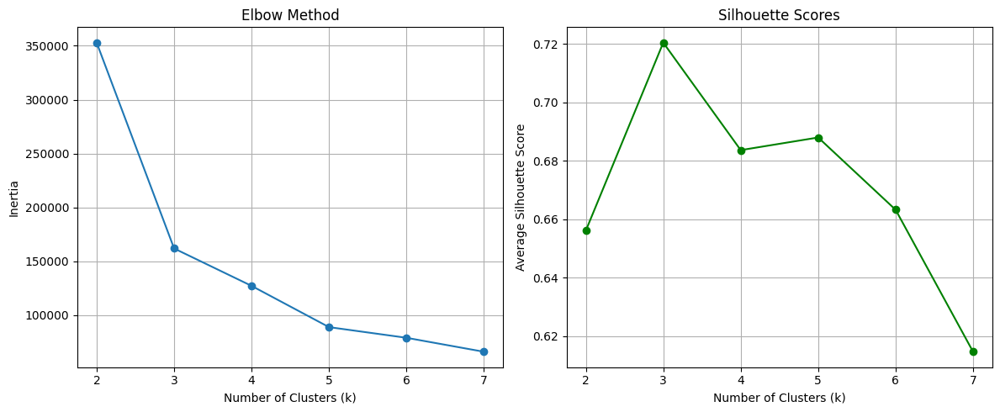

Optimal number of clusters from silhouette analysis: 3


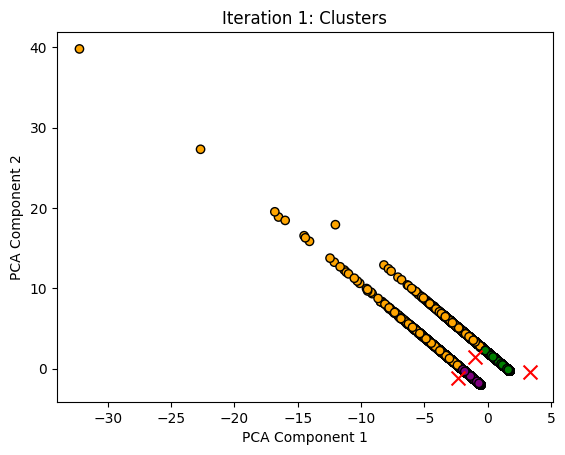

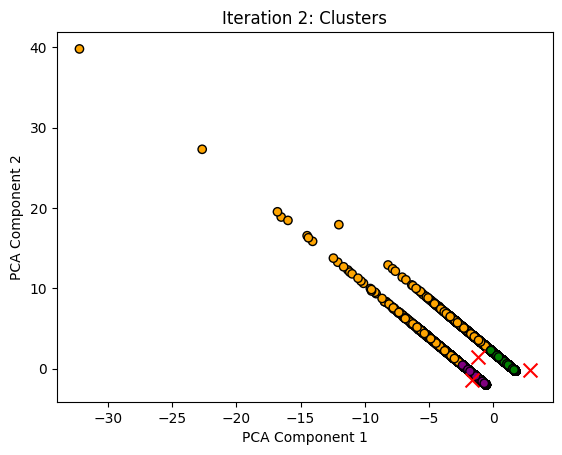

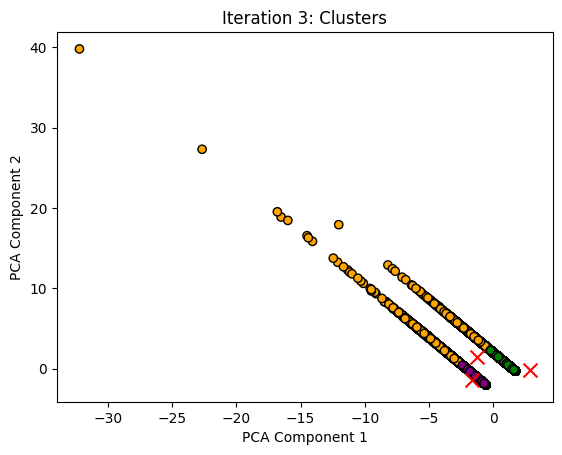

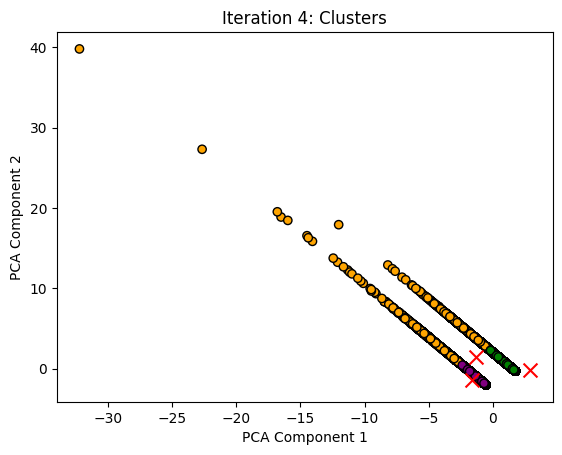

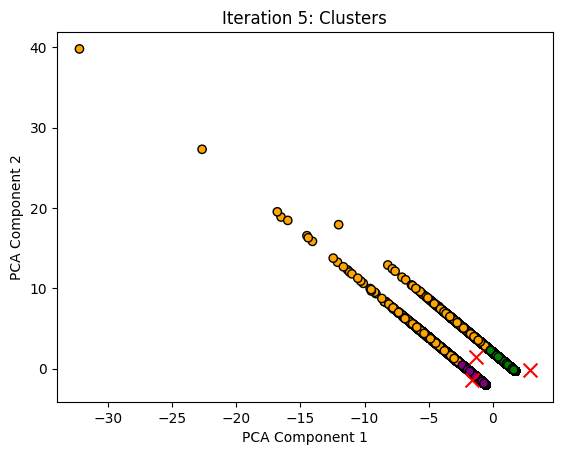

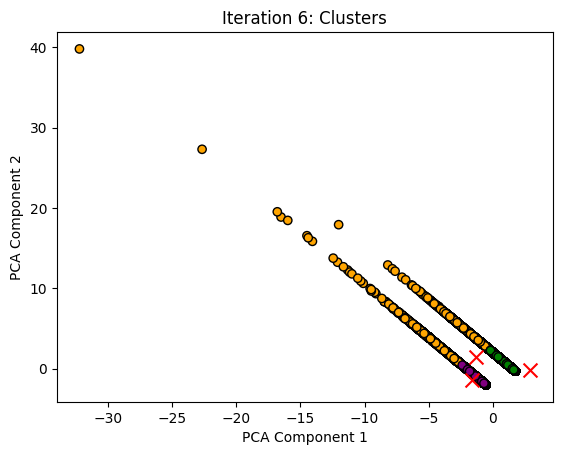

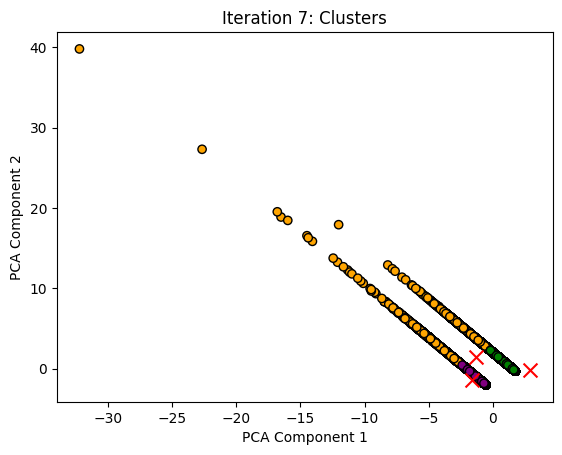

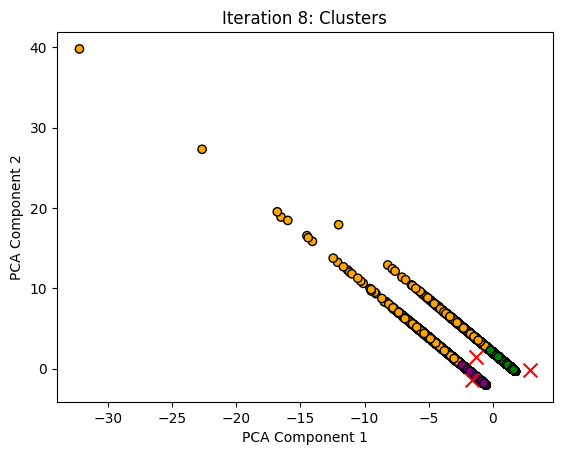

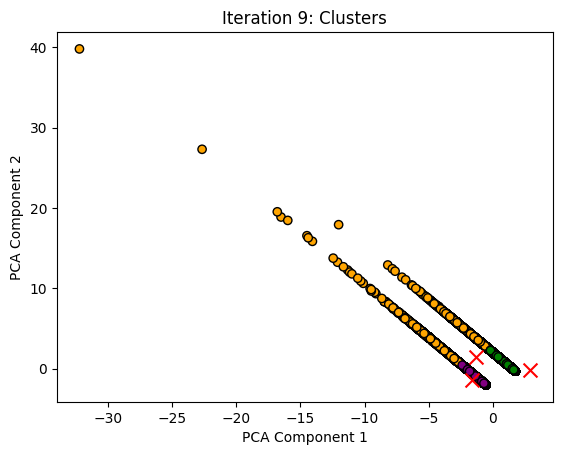

In [ ]:
import pandas as pd
import numpy as np
from pyspark.sql import SparkSession
from pyspark.sql.functions import to_timestamp, hour
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from multiprocessing import Pool
from functools import partial
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import time

columns = [
    'trip_distance',
    'fare_amount',
    'tpep_pickup_datetime',
    'payment_type'
]
sampled_df = df.sample(fraction=0.002, seed=42)

sampled_df = sampled_df[columns].dropna()

# Convert to timestamp and extract hour using PySpark
df = df.withColumn("pickup_hour", hour(to_timestamp(df["tpep_pickup_datetime"])))

# Drop the original pickup datetime column
sampled_df = sampled_df.drop("tpep_pickup_datetime")

# One-hot encode payment_type using PySpark
sampled_df = pd.get_dummies(sampled_df.toPandas(), columns=['payment_type'], prefix='pay')

# Sample the DataFrame

# Prepare features for clustering
features = sampled_df.columns
X = sampled_df.values
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Elbow Method and Silhouette Score calculations
inertia = []
silhouette_avg_list = []
k_values = range(2, 8)  # Change the range

for k in k_values:
    kmeans_model = KMeans(n_clusters=k, random_state=0)
    cluster_labels = kmeans_model.fit_predict(X)

    inertia.append(kmeans_model.inertia_)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_avg_list.append(silhouette_avg)

# Plotting results
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_avg_list, marker='o', color='green')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.xticks(k_values)
plt.grid(True)

plt.tight_layout()
plt.show()

# Determine optimal k
optimal_k = k_values[np.argmax(silhouette_avg_list)]
print(f"Optimal number of clusters from silhouette analysis: {optimal_k}")

# KMeans Clustering Implementation
def initialize_centroids(X, k):
    centroids = np.zeros((k, X.shape[1]))
    centroids[0] = X[np.random.randint(X.shape[0])]
    for i in range(1, k):
        distances = np.array([min(np.linalg.norm(x - centroids[j])**2 for j in range(i)) for x in X])
        probabilities = distances / distances.sum()
        centroids[i] = X[np.random.choice(range(X.shape[0]), p=probabilities)]
    return centroids

def compute_distance(x, centroids):
    distances = np.linalg.norm(x - centroids, axis=1)
    return np.argmin(distances)

def assign_clusters(X, centroids):
    with Pool() as pool:
        func = partial(compute_distance, centroids=centroids)
        labels = pool.map(func, X)
    return np.array(labels)

def update_centroids(X, clusters, k):
    return np.array([X[clusters == i].mean(axis=0) for i in range(k)])

def kmeans(X, k, max_iters=10, sleep_time=1):
    centroids = initialize_centroids(X, k)
    for i in range(max_iters):
        clusters = assign_clusters(X, centroids)
        new_centroids = update_centroids(X, clusters, k)

        try:
            from sklearn.decomposition import PCA
            X_2D = PCA(n_components=2).fit_transform(X)
            centroids_2D = PCA(n_components=2).fit_transform(centroids)
        except:
            X_2D, centroids_2D = X[:, :2], centroids[:, :2]

        plt.scatter(X_2D[:, 0], X_2D[:, 1], c=clusters, cmap=ListedColormap(['orange', 'blue', 'green', 'purple']), marker='o', edgecolor='k')
        plt.scatter(centroids_2D[:, 0], centroids_2D[:, 1], c='red', marker='x', s=100)
        plt.title(f"Iteration {i+1}: Clusters")
        plt.xlabel("PCA Component 1")
        plt.ylabel("PCA Component 2")
        plt.show()

        time.sleep(sleep_time)

        if np.allclose(centroids, new_centroids):
            break
        centroids = new_centroids

    return clusters, centroids

# Run KMeans with the optimal number of clusters
clusters, centroids = kmeans(X, optimal_k)




#Question 4
Predict whether a passenger will pay by card or cash
1. As it binary classification problem we would be using logistic regression.
2. Do the necessary feature engineering and then find the accuracy, precision, F1-score and recall.
3. Later perform hyperparameter tuning to find the more optimal parameters.
4. Later we would be finding p threshold to get higher F1-score


In [ ]:
from pyspark.sql.functions import hour, date_format, unix_timestamp
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Sample data
sampled_df = df.sample(fraction=0.1, seed=42)


# Replace PULocationID & DOLocationID with zone names
pu_lookup = lookup_df.withColumnRenamed("LocationID", "PULocationID").withColumnRenamed("Zone", "Pickup_Zone")
do_lookup = lookup_df.withColumnRenamed("LocationID", "DOLocationID").withColumnRenamed("Zone", "Drop_Zone")

df1 = sampled_df.join(pu_lookup, on="PULocationID", how="left")
df1 = df1.join(do_lookup, on="DOLocationID", how="left")

# Feature engineering
df1 = df1.withColumn("Hour", hour("tpep_pickup_datetime")) \
         .withColumn("DayOfWeek", date_format("tpep_pickup_datetime", "EEEE")) \
         .withColumn("Trip_Duration", (unix_timestamp("tpep_dropoff_datetime") - unix_timestamp("tpep_pickup_datetime")) / 60)

# Drop nulls
df1 = df1.na.drop(subset=["Trip_Duration", "Pickup_Zone", "Drop_Zone", "DayOfWeek"])

# Binary Classification: Convert payment_type to binary
# Example: 1 = Credit card, others = 0
df1 = df1.withColumn("Churn", (df1["payment_type"] == 1).cast("integer"))

# Indexing categorical columns
indexers = [
    StringIndexer(inputCol="Pickup_Zone", outputCol="Pickup_Zone_Index", handleInvalid="keep"),
    StringIndexer(inputCol="Drop_Zone", outputCol="Drop_Zone_Index", handleInvalid="keep"),
    StringIndexer(inputCol="DayOfWeek", outputCol="DayOfWeek_Index", handleInvalid="keep")
]

# One-hot encoding
encoder = OneHotEncoder(inputCols=["Pickup_Zone_Index", "Drop_Zone_Index", "DayOfWeek_Index"],
                        outputCols=["Pickup_Zone_OHE", "Drop_Zone_OHE", "DayOfWeek_OHE"])

# Assemble features
assembler = VectorAssembler(
    inputCols=["trip_distance", "Hour", "Trip_Duration",
               "Pickup_Zone_OHE", "Drop_Zone_OHE", "DayOfWeek_OHE"],
    outputCol="features"
)

# Model
lr = LogisticRegression(featuresCol="features", labelCol="Churn")

# Pipeline
pipeline = Pipeline(stages=indexers + [encoder, assembler, lr])

# Split data
train_df, test_df = df1.randomSplit([0.8, 0.2], seed=42)

# Fit base model
model = pipeline.fit(train_df)
predictions = model.transform(test_df)

print("\n Sample Predictions:")
predictions.select("Churn", "prediction", "probability").show(10, truncate=False)

# Evaluation (Base Model)
precision_evaluator = MulticlassClassificationEvaluator(labelCol="Churn", predictionCol="prediction", metricName="precisionByLabel")
recall_evaluator = MulticlassClassificationEvaluator(labelCol="Churn", predictionCol="prediction", metricName="recallByLabel")
f1_evaluator = MulticlassClassificationEvaluator(labelCol="Churn", predictionCol="prediction", metricName="f1")

precision = precision_evaluator.evaluate(predictions)
recall = recall_evaluator.evaluate(predictions)
f1 = f1_evaluator.evaluate(predictions)

print("Base Model Performance:")
print(f'Precision: {precision:.2f}')
print(f'Recall:    {recall:.2f}')
print(f'F1 Score:  {f1:.2f}')


 Sample Predictions:
+-----+----------+----------------------------------------+
|Churn|prediction|probability                             |
+-----+----------+----------------------------------------+
|1    |1.0       |[0.18024608004657644,0.8197539199534236]|
|0    |1.0       |[0.1598202606335121,0.8401797393664879] |
|1    |1.0       |[0.17998579142459808,0.8200142085754019]|
|0    |1.0       |[0.14414470542491342,0.8558552945750866]|
|1    |1.0       |[0.14942693149948896,0.8505730685005111]|
|1    |1.0       |[0.14901239042773046,0.8509876095722695]|
|0    |1.0       |[0.1760335920565561,0.8239664079434439] |
|0    |1.0       |[0.15900364083387117,0.8409963591661288]|
|1    |1.0       |[0.15033636261814246,0.8496636373818576]|
|1    |1.0       |[0.15994645372835464,0.8400535462716454]|
+-----+----------+----------------------------------------+
only showing top 10 rows

Base Model Performance:
Precision: 0.60
Recall:    0.88
F1 Score:  0.54


In [ ]:

# Grid Search
paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.001, 0.01])
             .addGrid(lr.elasticNetParam, [0.1, 0.5])
             .build())

cv = CrossValidator(estimator=pipeline,
                    estimatorParamMaps=paramGrid,
                    evaluator=f1_evaluator,
                    numFolds=3)

cvModel = cv.fit(train_df)
cv_predictions = cvModel.transform(test_df)

# Evaluation (Tuned Model)
cv_precision = precision_evaluator.evaluate(cv_predictions)
cv_recall = recall_evaluator.evaluate(cv_predictions)
cv_f1 = f1_evaluator.evaluate(cv_predictions)

print("\n Tuned Model Performance:")
print(f'Precision: {cv_precision:.2f}')
print(f'Recall:    {cv_recall:.2f}')
print(f'F1 Score:  {cv_f1:.2f}')

# Best model parameters
print("\n Best Model Parameters:")
print(cvModel.bestModel.stages[-1].extractParamMap())


 Tuned Model Performance:
Precision: 0.60
Recall:    0.88
F1 Score:  0.54

 Best Model Parameters:
{Param(parent='LogisticRegression_7152be8def54', name='aggregationDepth', doc='suggested depth for treeAggregate (>= 2).'): 2, Param(parent='LogisticRegression_7152be8def54', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0, Param(parent='LogisticRegression_7152be8def54', name='family', doc='The name of family which is a description of the label distribution to be used in the model. Supported options: auto, binomial, multinomial'): 'auto', Param(parent='LogisticRegression_7152be8def54', name='featuresCol', doc='features column name.'): 'features', Param(parent='LogisticRegression_7152be8def54', name='fitIntercept', doc='whether to fit an intercept term.'): True, Param(parent='LogisticRegression_7152be8def54', name='labelCol', doc='label column name.'): 'Churn', Param(pare

In [ ]:
# Count instances of each class
df1.groupBy("Churn").count().show()


+-----+-------+
|Churn|  count|
+-----+-------+
|    1|3782943|
|    0|5128665|
+-----+-------+



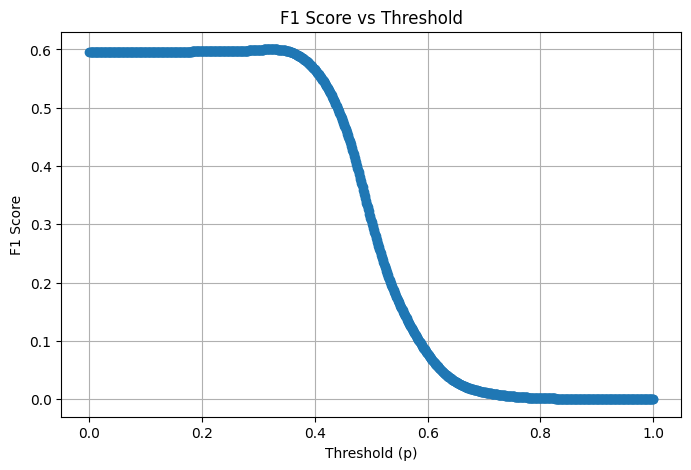

Best Threshold: 0.32 with F1 Score: 0.6004


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pyspark.sql.functions import udf
from pyspark.sql.types import DoubleType

# Extract probabilities and true labels
prob_labels = predictions.select("Churn", "probability")

# Collect as local data
prob_labels_local = prob_labels.rdd.map(lambda row: (row['Churn'], float(row['probability'][1]))).collect()

# Convert to Pandas for processing
df_probs = pd.DataFrame(prob_labels_local, columns=["label", "prob"])

# Compute F1 score for various thresholds
from sklearn.metrics import f1_score

thresholds = np.linspace(0, 1, 1000)
f1_scores = []

for t in thresholds:
    preds = (df_probs["prob"] >= t).astype(int)
    score = f1_score(df_probs["label"], preds)
    f1_scores.append(score)

# Plot F1 vs Threshold
plt.figure(figsize=(8, 5))
plt.plot(thresholds, f1_scores, marker='o')
plt.title("F1 Score vs Threshold")
plt.xlabel("Threshold (p)")
plt.ylabel("F1 Score")
plt.grid(True)
plt.show()

# Print best threshold
best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
print(f"Best Threshold: {best_threshold:.2f} with F1 Score: {f1_scores[best_idx]:.4f}")


Hence, as observed for = 0.32 we could get the highest F1-score 60 percent which is still considered quite low. But we have high recall so we could further try non-linear ml models.

# Question 5



Predict the fare of a taxi trip based on borough-specific factors such as pickup and
drop-off boroughs, and analyze how fares vary across different NYC boroughs.

Steps:
1. We would use logistic regresiion to predict fares across different boroughs.
2. First we would perform feature engineering and then predict values and find rmse.
3. Later use ML flow for end to end ML work flow.

In [ ]:
from pyspark.sql.functions import hour
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
import mlflow
import mlflow.spark

# Sample data
sampled_df = df.sample(fraction=0.01, seed=42)

# Join to get Pickup and Drop Boroughs
pu_borough = lookup_df.withColumnRenamed("LocationID", "PULocationID").withColumnRenamed("Borough", "Pickup_Borough")
do_borough = lookup_df.withColumnRenamed("LocationID", "DOLocationID").withColumnRenamed("Borough", "Drop_Borough")

df1 = sampled_df.join(pu_borough, on="PULocationID", how="left") \
                .join(do_borough, on="DOLocationID", how="left")

# Filter and add time features
df1 = df1.na.drop(subset=["Pickup_Borough", "Drop_Borough", "fare_amount", "trip_distance"])
df1 = df1.withColumn("Hour", hour("tpep_pickup_datetime"))

# Index and One-Hot Encode
indexer_pickup_borough = StringIndexer(inputCol="Pickup_Borough", outputCol="Pickup_Borough_Index", handleInvalid="keep")
indexer_drop_borough = StringIndexer(inputCol="Drop_Borough", outputCol="Drop_Borough_Index", handleInvalid="keep")

encoder = OneHotEncoder(
    inputCols=["Pickup_Borough_Index", "Drop_Borough_Index"],
    outputCols=["Pickup_Borough_OHE", "Drop_Borough_OHE"]
)

# Feature assembly and scaling
assembler = VectorAssembler(
    inputCols=["trip_distance", "Hour", "Pickup_Borough_OHE", "Drop_Borough_OHE"],
    outputCol="features"
)

scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)

# Linear Regression (Ridge)
lr = LinearRegression(featuresCol="scaled_features", labelCol="fare_amount",
                      solver="l-bfgs", elasticNetParam=0.0, regParam=0.1)

# Pipeline
pipeline = Pipeline(stages=[
    indexer_pickup_borough, indexer_drop_borough,
    encoder, assembler, scaler, lr
])

# Split
train_df, test_df = df1.randomSplit([0.8, 0.2], seed=42)

# MLflow training
with mlflow.start_run() as run:
    pipeline_model = pipeline.fit(train_df)

    predictions = pipeline_model.transform(test_df).na.drop(subset=["fare_amount", "prediction"])

    evaluator = RegressionEvaluator(labelCol="fare_amount", predictionCol="prediction", metricName="rmse")
    rmse = evaluator.evaluate(predictions)
    print(f"Fare Prediction RMSE: {rmse:.2f}")

    mlflow.log_metric("rmse", rmse)
    mlflow.spark.log_model(pipeline_model, "taxi_fare_pipeline")

    run_id = run.info.run_id
    model_uri = f"runs:/{run_id}/taxi_fare_pipeline"
    print("Model URI:", model_uri)

    mlflow.register_model(model_uri, "TaxiFarePredictionPipeline")


Fare Prediction RMSE: 3.58


2025/04/04 21:09:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model URI: runs:/65c8042f5a1c4ea7bfc900b98787c2a2/taxi_fare_pipeline


Successfully registered model 'TaxiFarePredictionPipeline'.
Created version '1' of model 'TaxiFarePredictionPipeline'.


In [ ]:
import mlflow.pyfunc
import pandas as pd

# Load the model
model_uri = "models:/TaxiFarePredictionPipeline/1"
model = mlflow.pyfunc.load_model(model_uri)

# Predict sample
input_data = pd.DataFrame([{
    "trip_distance": 3.5,
    "Hour": 18,
    "Pickup_Borough": "Manhattan",
    "Drop_Borough": "Brooklyn"
}])

fare_prediction = model.predict(input_data)
print("Predicted Fare:", fare_prediction)


2025/04/04 21:09:47 INFO mlflow.spark: File '/content/mlruns/0/65c8042f5a1c4ea7bfc900b98787c2a2/artifacts/taxi_fare_pipeline/sparkml' is already on DFS, copy is not necessary.


Predicted Fare: [12.077661613164539]


In [ ]:
df1.groupBy("Pickup_Borough", "Drop_Borough") \
   .avg("fare_amount") \
   .orderBy("avg(fare_amount)", ascending=False) \
   .show(truncate=False)


+--------------+-------------+------------------+
|Pickup_Borough|Drop_Borough |avg(fare_amount)  |
+--------------+-------------+------------------+
|Queens        |EWR          |78.52857142857144 |
|EWR           |Unknown      |65.0              |
|EWR           |EWR          |64.49514705882353 |
|Brooklyn      |EWR          |59.957142857142856|
|Queens        |N/A          |58.65731707317073 |
|Unknown       |EWR          |57.65             |
|Queens        |Staten Island|56.91428571428571 |
|Manhattan     |EWR          |55.88468571428572 |
|Bronx         |EWR          |53.5              |
|Bronx         |N/A          |52.28823529411765 |
|N/A           |EWR          |48.7625           |
|Manhattan     |Staten Island|42.91842105263158 |
|Brooklyn      |Bronx        |37.36071428571429 |
|EWR           |Manhattan    |37.199999999999996|
|N/A           |Unknown      |34.59444444444445 |
|Queens        |Bronx        |33.22716390423573 |
|Queens        |Brooklyn     |30.770480916030536|


As observed it seems thatqueens and EWR have highest fare amount and brooklyn and staten island being the lowest.

#Question 6
Predict the tip amount given by passengers based on trip characteristics

1. For prediction we will be using linear regression again.
2. Perform feature engineering and find RMSE.
3. Finally incorporate the ML flow for end to end ML workflow.

In [ ]:
from pyspark.sql.functions import hour, date_format
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
import mlflow
import mlflow.spark

# Sample
sampled_df = df.sample(fraction=0.01, seed=42)

# Join with borough info
pu_borough = lookup_df.withColumnRenamed("LocationID", "PULocationID").withColumnRenamed("Borough", "Pickup_Borough")
do_borough = lookup_df.withColumnRenamed("LocationID", "DOLocationID").withColumnRenamed("Borough", "Drop_Borough")

df1 = sampled_df.join(pu_borough, on="PULocationID", how="left") \
                .join(do_borough, on="DOLocationID", how="left")

# Add temporal features
df1 = df1.withColumn("Hour", hour("tpep_pickup_datetime")) \
         .withColumn("DayOfWeek", date_format("tpep_pickup_datetime", "EEEE"))

# Drop nulls
df1 = df1.na.drop(subset=["Pickup_Borough", "Drop_Borough", "tip_amount", "fare_amount", "trip_distance", "payment_type", "DayOfWeek"])

# Index categorical features
indexers = [
    StringIndexer(inputCol=col, outputCol=f"{col}_Index", handleInvalid="keep")
    for col in ["Pickup_Borough", "Drop_Borough", "payment_type", "DayOfWeek"]
]

# One-hot encode
encoder = OneHotEncoder(
    inputCols=[f"{col}_Index" for col in ["Pickup_Borough", "Drop_Borough", "payment_type", "DayOfWeek"]],
    outputCols=[f"{col}_OHE" for col in ["Pickup_Borough", "Drop_Borough", "payment_type", "DayOfWeek"]]
)

# Assemble features
assembler = VectorAssembler(
    inputCols=["trip_distance", "fare_amount", "Hour"] +
              [f"{col}_OHE" for col in ["Pickup_Borough", "Drop_Borough", "payment_type", "DayOfWeek"]],
    outputCol="features"
)

# Scale features
scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)

# Model
lr = LinearRegression(featuresCol="scaled_features", labelCol="tip_amount",
                      solver="l-bfgs", elasticNetParam=0.0, regParam=0.1)

# Build pipeline
pipeline = Pipeline(stages=indexers + [encoder, assembler, scaler, lr])

# Train-test split
train_df, test_df = df1.randomSplit([0.8, 0.2], seed=42)

# MLflow training and logging
with mlflow.start_run() as run:
    pipeline_model = pipeline.fit(train_df)

    predictions = pipeline_model.transform(test_df).na.drop(subset=["tip_amount", "prediction"])

    evaluator = RegressionEvaluator(labelCol="tip_amount", predictionCol="prediction", metricName="rmse")
    rmse = evaluator.evaluate(predictions)
    print(f"Tip Prediction RMSE: {rmse:.2f}")

    mlflow.log_metric("rmse", rmse)
    mlflow.spark.log_model(pipeline_model, "tip_amount_pipeline")

    run_id = run.info.run_id
    model_uri = f"runs:/{run_id}/tip_amount_pipeline"
    print("Model URI:", model_uri)

    mlflow.register_model(model_uri, "TipAmountPredictionPipeline")


Tip Prediction RMSE: 1.12


2025/04/04 21:22:18 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model URI: runs:/3caccce9aea84235a9a26ae952b28004/tip_amount_pipeline


Successfully registered model 'TipAmountPredictionPipeline'.
Created version '1' of model 'TipAmountPredictionPipeline'.


In [ ]:
import mlflow.pyfunc
import pandas as pd

model_uri = "models:/TipAmountPredictionPipeline/1"
model = mlflow.pyfunc.load_model(model_uri)

input_data = pd.DataFrame([{
    "trip_distance": 4.2,
    "fare_amount": 18.5,
    "Hour": 20,
    "Pickup_Borough": "Manhattan",
    "Drop_Borough": "Brooklyn",
    "payment_type": "Credit card",
    "DayOfWeek": "Friday"
}])

tip_pred = model.predict(input_data)
print("Predicted Tip Amount:", tip_pred)


2025/04/04 21:22:19 INFO mlflow.spark: File '/content/mlruns/0/3caccce9aea84235a9a26ae952b28004/artifacts/tip_amount_pipeline/sparkml' is already on DFS, copy is not necessary.


Predicted Tip Amount: [1.6744224084366333]


In [ ]:
from pyspark.sql.functions import avg, round

# Group and aggregate
tip_grouped_df = df1.groupBy(
    "Pickup_Borough", "Drop_Borough", "payment_type", "DayOfWeek"
).agg(
    round(avg("tip_amount"), 2).alias("avg_tip_amount")
).orderBy("avg_tip_amount", ascending=False)

# Show top results
tip_grouped_df.show(20, truncate=False)


+--------------+-------------+------------+---------+--------------+
|Pickup_Borough|Drop_Borough |payment_type|DayOfWeek|avg_tip_amount|
+--------------+-------------+------------+---------+--------------+
|N/A           |EWR          |1           |Monday   |30.96         |
|Bronx         |N/A          |1           |Thursday |20.1          |
|Queens        |EWR          |1           |Saturday |20.0          |
|Queens        |EWR          |1           |Thursday |19.08         |
|Queens        |EWR          |1           |Wednesday|18.96         |
|Queens        |EWR          |1           |Tuesday  |18.79         |
|Bronx         |N/A          |1           |Sunday   |18.6          |
|Bronx         |N/A          |1           |Friday   |18.27         |
|N/A           |Unknown      |1           |Sunday   |17.5          |
|Queens        |EWR          |1           |Monday   |16.46         |
|Unknown       |EWR          |1           |Wednesday|16.0          |
|N/A           |Unknown      |1   

As observed from above EWR seems to have highest tip amount on mondays.

#Question 7
Predict whether a trip will result in a high or low fare based on early trip data

1. First we would use logistic regression for the inary classification.
2. Fine tune and change thresholds to obtain most optimal p and highets F1-score.


Tuned Model Performance:
Precision: 0.94
Recall:    0.97
F1 Score:  0.95

Best Model Parameters:
{Param(parent='LogisticRegression_172d4176ca11', name='aggregationDepth', doc='suggested depth for treeAggregate (>= 2).'): 2, Param(parent='LogisticRegression_172d4176ca11', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.5, Param(parent='LogisticRegression_172d4176ca11', name='family', doc='The name of family which is a description of the label distribution to be used in the model. Supported options: auto, binomial, multinomial'): 'auto', Param(parent='LogisticRegression_172d4176ca11', name='featuresCol', doc='features column name.'): 'features', Param(parent='LogisticRegression_172d4176ca11', name='fitIntercept', doc='whether to fit an intercept term.'): True, Param(parent='LogisticRegression_172d4176ca11', name='labelCol', doc='label column name.'): 'label', Param(parent

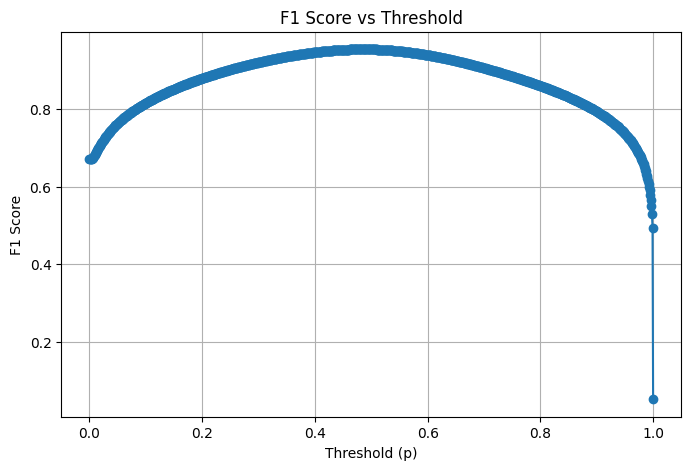

Best Threshold: 0.48 with F1 Score: 0.9542
+-----------+-----+----------------+
|fare_amount|label|final_prediction|
+-----------+-----+----------------+
|17.3       |1    |High Fare       |
|8.5        |1    |High Fare       |
|20.1       |1    |High Fare       |
|9.3        |1    |High Fare       |
|12.1       |1    |High Fare       |
|23.3       |1    |High Fare       |
|6.5        |0    |Low Fare        |
|68.0       |1    |Low Fare        |
|8.9        |1    |High Fare       |
|8.5        |1    |High Fare       |
+-----------+-----+----------------+
only showing top 10 rows



In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import unix_timestamp, hour, date_format, month, col, when
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
import mlflow
import mlflow.spark
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Initialize Spark session
spark = SparkSession.builder.appName("TaxiFarePrediction").getOrCreate()

# Sample data
sampled_df = df.sample(fraction=0.1, seed=42)

# Join with borough data
pu_borough = lookup_df.withColumnRenamed("LocationID", "PULocationID").withColumnRenamed("Borough", "Pickup_Borough")
do_borough = lookup_df.withColumnRenamed("LocationID", "DOLocationID").withColumnRenamed("Borough", "Drop_Borough")

df1 = sampled_df.join(pu_borough, on="PULocationID", how="left") \
                .join(do_borough, on="DOLocationID", how="left")

# Add time-based features
df1 = df1.withColumn("Hour", hour("tpep_pickup_datetime")) \
         .withColumn("DayOfWeek", date_format("tpep_pickup_datetime", "EEEE"))

# Compute trip duration and drop nulls
df1 = df1.withColumn("Trip_Duration",
                     (unix_timestamp("tpep_dropoff_datetime") - unix_timestamp("tpep_pickup_datetime")) / 60)
df1 = df1.na.drop(subset=["Trip_Duration", "Pickup_Borough", "Drop_Borough", "DayOfWeek", "fare_amount"])

# Create binary label: high or low fare based on median fare
median_fare = df1.approxQuantile("fare_amount", [0.5], 0.01)[0]
df1 = df1.withColumn("label", when(col("fare_amount") > median_fare, 1).otherwise(0))

# Split data into train (Jan-May) and test (June)
train_df = df1.filter(month("tpep_pickup_datetime") <= 5)
test_df = df1.filter(month("tpep_pickup_datetime") == 6)

# Calculate class weights
class_weights = train_df.groupBy("label").count().toPandas()
total = class_weights["count"].sum()
class_weights["weight"] = total / (len(class_weights) * class_weights["count"])
weight_dict = {row["label"]: row["weight"] for _, row in class_weights.iterrows()}

# Assign weights to the training data
train_df = train_df.withColumn("weight", when(col("label") == 1, weight_dict[1]).otherwise(weight_dict[0]))

# Indexing categorical variables
indexer_pickup_borough = StringIndexer(inputCol="Pickup_Borough", outputCol="Pickup_Borough_Index", handleInvalid="keep")
indexer_drop_borough = StringIndexer(inputCol="Drop_Borough", outputCol="Drop_Borough_Index", handleInvalid="keep")
indexer_day_of_week = StringIndexer(inputCol="DayOfWeek", outputCol="DayOfWeek_Index", handleInvalid="keep")

# One-hot encoding
encoder = OneHotEncoder(inputCols=["Pickup_Borough_Index", "Drop_Borough_Index", "DayOfWeek_Index"],
                        outputCols=["Pickup_Borough_OHE", "Drop_Borough_OHE", "DayOfWeek_OHE"])

# Assemble features
assembler = VectorAssembler(
    inputCols=["Hour", "Trip_Duration", "trip_distance",
               "Pickup_Borough_OHE", "Drop_Borough_OHE", "DayOfWeek_OHE"],
    outputCol="features"
)

# Logistic Regression with class weight
lr = LogisticRegression(featuresCol="features", labelCol="label", weightCol="weight", maxIter=10)

# Create pipeline
pipeline = Pipeline(stages=[indexer_pickup_borough, indexer_drop_borough,
                             indexer_day_of_week, encoder, assembler, lr])

# Grid Search for hyperparameters
paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.001, 0.01])
             .addGrid(lr.elasticNetParam, [0.1, 0.5])
             .build())

# Cross-Validator
cv = CrossValidator(estimator=pipeline,
                    estimatorParamMaps=paramGrid,
                    evaluator=MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1"),
                    numFolds=3)

# Fit the model
cvModel = cv.fit(train_df)
cv_predictions = cvModel.transform(test_df)

# Evaluation (Tuned Model)
precision_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="precisionByLabel")
recall_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="recallByLabel")
f1_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")

cv_precision = precision_evaluator.evaluate(cv_predictions)
cv_recall = recall_evaluator.evaluate(cv_predictions)
cv_f1 = f1_evaluator.evaluate(cv_predictions)

print("\nTuned Model Performance:")
print(f'Precision: {cv_precision:.2f}')
print(f'Recall:    {cv_recall:.2f}')
print(f'F1 Score:  {cv_f1:.2f}')

# Best model parameters
print("\nBest Model Parameters:")
print(cvModel.bestModel.stages[-1].extractParamMap())

# Threshold evaluation for F1 score plotting
prob_labels = cv_predictions.select("label", "probability")

# Collect as local data
prob_labels_local = prob_labels.rdd.map(lambda row: (row['label'], float(row['probability'][1]))).collect()

# Convert to Pandas for processing
df_probs = pd.DataFrame(prob_labels_local, columns=["label", "prob"])

# Compute F1 score for various thresholds
thresholds = np.linspace(0, 1, 1000)
f1_scores = []

from sklearn.metrics import f1_score

for t in thresholds:
    preds = (df_probs["prob"] >= t).astype(int)
    score = f1_score(df_probs["label"], preds)
    f1_scores.append(score)

# Plot F1 vs Threshold
plt.figure(figsize=(8, 5))
plt.plot(thresholds, f1_scores, marker='o')
plt.title("F1 Score vs Threshold")
plt.xlabel("Threshold (p)")
plt.ylabel("F1 Score")
plt.grid(True)
plt.show()

# Best threshold
best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
print(f"Best Threshold: {best_threshold:.2f} with F1 Score: {f1_scores[best_idx]:.4f}")


from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

def label_prediction(prob_vector):
    # prob_vector is a vector; extract the probability for label 1
    # Using the best threshold to assign label
    return "High Fare" if prob_vector[1] >= best_threshold else "Low Fare"

label_udf = udf(label_prediction, StringType())

final_predictions = cv_predictions.withColumn("final_prediction", label_udf(col("probability")))
final_predictions.select("fare_amount", "label", "final_prediction").show(10, truncate=False)


As we could see we see quite a high F1-score, accuracy, precision, recall and from above we coul see the categorization and high and low fare for various attributes

#Question 8
Identify and predict traffic congestion hotspots based on trip patterns and times

1. Perform K-means  for the clustering and find the optimal k through calucarion of inertia.
2. Using the optimal k we could perfomr clustering and analyse

k = 2, Inertia = 202290759.20978785
k = 3, Inertia = 141705673.00287044
k = 4, Inertia = 97226445.01531404
k = 5, Inertia = 73437618.54883432
k = 6, Inertia = 63388910.01552302
k = 7, Inertia = 58976717.176380634


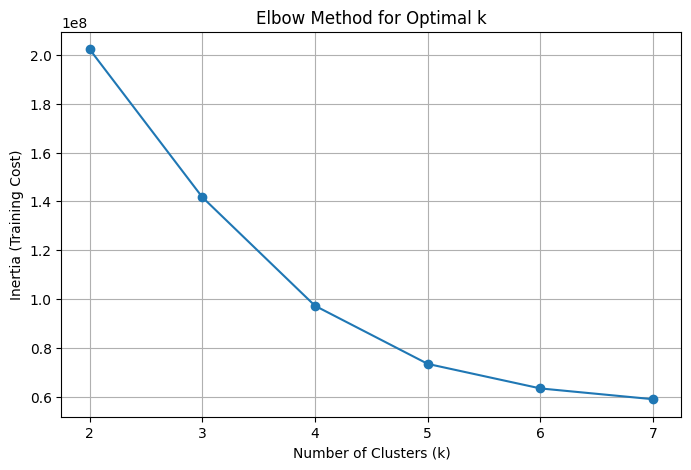

In [ ]:

from pyspark.sql import SparkSession
from pyspark.sql.functions import hour, date_format, col, count, month
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.clustering import KMeans
from pyspark.ml import Pipeline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np



sampled_df = df.sample(fraction=0.1, seed=42)

pu_borough = lookup_df.withColumnRenamed("LocationID", "PULocationID") \
                      .withColumnRenamed("Borough", "Pickup_Borough")
do_borough = lookup_df.withColumnRenamed("LocationID", "DOLocationID") \
                      .withColumnRenamed("Borough", "Drop_Borough")

df_with_boroughs = sampled_df.join(pu_borough, on="PULocationID", how="left") \
                               .join(do_borough, on="DOLocationID", how="left")


df_with_boroughs = df_with_boroughs.withColumn("Hour", hour("tpep_pickup_datetime")) \
                                   .withColumn("DayOfWeek", date_format("tpep_pickup_datetime", "EEEE"))

# Drop rows with missing essential columns
df_with_boroughs = df_with_boroughs.na.drop(subset=["Pickup_Borough", "Drop_Borough", "Hour", "DayOfWeek", "trip_distance"])


# Index categorical columns: Pickup_Borough and Drop_Borough.
indexerPickup = StringIndexer(inputCol="Pickup_Borough", outputCol="Pickup_Borough_Index", handleInvalid="keep")
indexerDrop = StringIndexer(inputCol="Drop_Borough", outputCol="Drop_Borough_Index", handleInvalid="keep")

# One-hot encode the indexed columns.
encoder = OneHotEncoder(inputCols=["Pickup_Borough_Index", "Drop_Borough_Index"],
                        outputCols=["Pickup_Borough_OHE", "Drop_Borough_OHE"])

# Assemble features: Use Hour, trip_distance, and the one-hot encoded columns.
assembler = VectorAssembler(
    inputCols=["Hour", "trip_distance", "Pickup_Borough_OHE", "Drop_Borough_OHE"],
    outputCol="features"
)

# Build preprocessing pipeline.
preprocess_pipeline = Pipeline(stages=[indexerPickup, indexerDrop, encoder, assembler])
preprocessed_df = preprocess_pipeline.fit(df_with_boroughs).transform(df_with_boroughs)

ks = list(range(2, 8))
inertias = []

for k in ks:
    kmeans = KMeans(k=k, seed=42, featuresCol="features", predictionCol="hotspot")
    model = kmeans.fit(preprocessed_df)
    inertia = model.summary.trainingCost  # Sum of squared distances
    inertias.append(inertia)
    print(f"k = {k}, Inertia = {inertia}")

# Plot the elbow curve.
plt.figure(figsize=(8, 5))
plt.plot(ks, inertias, marker='o', linestyle='-')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Training Cost)")
plt.title("Elbow Method for Optimal k")
plt.xticks(ks)
plt.grid(True)
plt.show()





At 4 we could see elbow

+-------+--------------+------------+----------+
|hotspot|Pickup_Borough|Drop_Borough|trip_count|
+-------+--------------+------------+----------+
|2      |Manhattan     |Manhattan   |2956329   |
|3      |Manhattan     |Manhattan   |2905711   |
|0      |Manhattan     |Manhattan   |1581320   |
|1      |Queens        |Manhattan   |153532    |
|1      |Manhattan     |Queens      |133041    |
|2      |Manhattan     |Brooklyn    |116129    |
|0      |Manhattan     |Brooklyn    |97727     |
|0      |Manhattan     |Queens      |78502     |
|2      |Unknown       |Unknown     |71601     |
|3      |Unknown       |Unknown     |64693     |
|2      |Manhattan     |Queens      |49207     |
|2      |Brooklyn      |Brooklyn    |41707     |
|0      |Unknown       |Unknown     |41546     |
|2      |Queens        |Queens      |40690     |
|0      |Brooklyn      |Brooklyn    |39949     |
|3      |Queens        |Queens      |39770     |
|0      |Queens        |Queens      |38283     |
|2      |Queens     

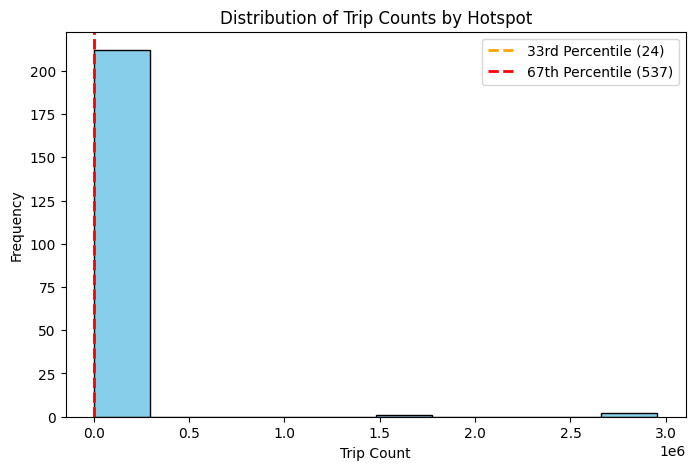

In [ ]:
optimal_k = 4


kmeans = KMeans(k=optimal_k, seed=42, featuresCol="features", predictionCol="hotspot")
kmeans_model = kmeans.fit(preprocessed_df)
clustered_df = kmeans_model.transform(preprocessed_df)


hotspot_summary = clustered_df.groupBy("hotspot", "Pickup_Borough", "Drop_Borough") \
    .agg(count("*").alias("trip_count")) \
    .orderBy(col("trip_count").desc())

hotspot_summary.show(truncate=False)


# Convert the aggregation to Pandas for labeling
hotspot_summary_pd = hotspot_summary.toPandas()

# Define thresholds using quantiles
q1 = hotspot_summary_pd['trip_count'].quantile(0.33)
q2 = hotspot_summary_pd['trip_count'].quantile(0.67)

def label_congestion(trip_count):
    if trip_count >= q2:
        return "Highly Busy"
    elif trip_count >= q1:
        return "Busy"
    else:
        return "Free"

hotspot_summary_pd['congestion_level'] = hotspot_summary_pd['trip_count'].apply(label_congestion)
hotspot_summary_pd = hotspot_summary_pd.sort_values(by="trip_count", ascending=False)
print(hotspot_summary_pd)


plt.figure(figsize=(8, 5))
plt.hist(hotspot_summary_pd['trip_count'], bins=10, color='skyblue', edgecolor='black')
plt.axvline(q1, color='orange', linestyle='dashed', linewidth=2, label=f'33rd Percentile ({q1:.0f})')
plt.axvline(q2, color='red', linestyle='dashed', linewidth=2, label=f'67th Percentile ({q2:.0f})')
plt.title("Distribution of Trip Counts by Hotspot")
plt.xlabel("Trip Count")
plt.ylabel("Frequency")
plt.legend()
plt.show()

as observed manhattan and queen are one of the areas in newyork with highest congestion